In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
import os
import zipfile


# Step 2: File path define
zip_path = "/content/drive/MyDrive/BTL.zip"
extract_folder = "/content/drive/MyDrive/BTL"

# Step 3: যদি Folder না থাকে তাহলে create করো
os.makedirs(extract_folder, exist_ok=True)

# Step 4: Unzip into that folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

print(f"✅ Unzipped to: {extract_folder}")


✅ Unzipped to: /content/drive/MyDrive/BTL


In [ ]:
import os
import glob

base_path = "/content/drive/MyDrive/BTL"

sets = ['train', 'valid', 'test']
total_count = 0

for s in sets:
    image_folder = os.path.join(base_path, s, "images")
    image_files = glob.glob(os.path.join(image_folder, "*.jpg"))
    count = len(image_files)
    total_count += count
    print(f"{s.capitalize()} set has {count} images.")

print(f"\n✅ Total image count across all sets: {total_count}")

Train set has 1370 images.
Valid set has 395 images.
Test set has 191 images.

✅ Total image count across all sets: 1956


In [ ]:
!pip install roboflow
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 96.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 29.4 MB/s eta 0:00:00
   ━

In [ ]:
# Load COCO-pretrained YOLOv11n model
from ultralytics import YOLO

model = YOLO("yolo11s.pt")


ModuleNotFoundError: No module named 'ultralytics'

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov11s")  # try better model than 'n'

results = model.train(
    data="/content/drive/MyDrive/BTL/data.yaml",
    epochs=100,
    imgsz=768,         # larger image size improves tumor detection
    batch=8,           # adjust based on GPU RAM
    cache=True,
    amp=True,
    patience=20,
    lr0=0.005,         # smoother learning
    lrf=0.01,
    optimizer='SGD',   # default, but explicitly setting it
    project="StrokeProject",
    name="exp4_better_model",
    exist_ok=True,
    val=True
)


In [ ]:
# Train model

results = model.train(
        data="/content/drive/MyDrive/BTL/data.yaml",  # This is the path to your data.yaml file
        epochs=100,
        imgsz=640,         # Lower image size for faster training
        batch=16,
        cache=True,        # Caches dataset for speed
        amp=True,          # Mixed precision training (faster and memory-efficient)
        patience=20,       # Early stopping if no improvement for 10 epochs
        project="StrokeProject",
        name="exp3",
       # resume=True,       # Resume training from last checkpoint if available
        exist_ok=True
    )

Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/BTL/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=12.0, pretr

train: Scanning /content/drive/MyDrive/BTL/train/labels.cache... 1370 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1370/1370 [00:00<?, ?it/s]

train: /content/drive/MyDrive/BTL/train/images/no_tumor_914_jpg.rf.6714544aee2bde5213fd2c366dff62aa.jpg: 1 duplicate labels removed
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1456, len(boxes) = 1461. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (1.6GB RAM): 100%|██████████| 1370/1370 [00:08<00:00, 165.48it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 21.0±39.1 ms, read: 14.5±8.8 MB/s, size: 51.4 KB)


val: Scanning /content/drive/MyDrive/BTL/valid/labels.cache... 395 images, 0 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.5GB RAM): 100%|██████████| 395/395 [00:02<00:00, 184.65it/s]


Plotting labels to StrokeProject/exp3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to StrokeProject/exp3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.55G     0.9186      3.026      1.284         21        640: 100%|██████████| 86/86 [00:27<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.45it/s]

                   all        395        415      0.905        0.3       0.44      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.72G     0.9352      2.006      1.282         12        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.93it/s]

                   all        395        415      0.794      0.356      0.393      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.72G     0.9636      1.712      1.293         18        640: 100%|██████████| 86/86 [00:24<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.07it/s]

                   all        395        415      0.801      0.347      0.427      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.72G     0.9574      1.504      1.293         12        640: 100%|██████████| 86/86 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.31it/s]


                   all        395        415      0.551      0.512      0.456      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.72G     0.9405      1.337      1.277         15        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.69it/s]


                   all        395        415      0.751      0.516      0.546      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.72G     0.9055      1.196      1.263         18        640: 100%|██████████| 86/86 [00:26<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.19it/s]

                   all        395        415      0.633       0.45      0.463      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.72G     0.8935      1.118      1.226         21        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.28it/s]

                   all        395        415      0.669       0.53      0.534      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.72G     0.8722      1.016       1.22         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.31it/s]

                   all        395        415      0.538      0.543      0.563      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.72G     0.8485     0.9806      1.208         20        640: 100%|██████████| 86/86 [00:25<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.34it/s]

                   all        395        415      0.775      0.597      0.585      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.72G     0.8594     0.9448      1.223         16        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.32it/s]

                   all        395        415      0.779      0.548      0.563       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.72G     0.8233     0.8771      1.192         17        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.74it/s]

                   all        395        415       0.78      0.579      0.598      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.72G     0.7989     0.8961      1.169         18        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.11it/s]

                   all        395        415      0.842      0.549      0.616      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.72G      0.814     0.8914      1.203         27        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all        395        415      0.795      0.546      0.603      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.72G     0.7884     0.8495      1.176         17        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.45it/s]

                   all        395        415       0.73      0.487      0.551      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.72G     0.7992     0.8378      1.182         15        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.45it/s]

                   all        395        415      0.797      0.584      0.602      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.72G     0.7854      0.798      1.196         21        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.36it/s]

                   all        395        415       0.74      0.556      0.568      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.72G     0.7721     0.8159      1.168         14        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all        395        415      0.778      0.593        0.6      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.72G     0.7565      0.789      1.167         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.24it/s]

                   all        395        415      0.746      0.589      0.597       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.72G      0.776     0.7721      1.168         16        640: 100%|██████████| 86/86 [00:24<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        395        415      0.866      0.606      0.655      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.72G     0.7506     0.7467      1.156         20        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.69it/s]


                   all        395        415      0.852       0.61      0.653      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.72G       0.76     0.7388      1.152         24        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.59it/s]

                   all        395        415      0.794      0.581      0.612      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.72G     0.7285     0.6967      1.145         20        640: 100%|██████████| 86/86 [00:25<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]


                   all        395        415      0.812       0.51      0.586      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.72G     0.7267     0.7097       1.15         18        640: 100%|██████████| 86/86 [00:25<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.65it/s]


                   all        395        415      0.882      0.571      0.646      0.496

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.72G     0.7452     0.7092      1.156         18        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]

                   all        395        415      0.829      0.573      0.621      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.72G     0.6947     0.6984      1.117         18        640: 100%|██████████| 86/86 [00:26<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]

                   all        395        415      0.819      0.589      0.629      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.72G     0.7383      0.726      1.135         26        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.32it/s]

                   all        395        415      0.854      0.585      0.632      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.72G      0.708     0.6902      1.127         13        640: 100%|██████████| 86/86 [00:24<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.91it/s]

                   all        395        415      0.848      0.626      0.657      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.72G     0.7235     0.6804      1.149         27        640: 100%|██████████| 86/86 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.08it/s]

                   all        395        415      0.839      0.624      0.652      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.72G     0.6902     0.6492      1.121         18        640: 100%|██████████| 86/86 [00:24<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.11it/s]

                   all        395        415      0.856      0.634      0.664      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.72G      0.684     0.6597      1.106         13        640: 100%|██████████| 86/86 [00:24<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        395        415      0.813      0.573      0.603      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.72G     0.6913     0.6626       1.12         20        640: 100%|██████████| 86/86 [00:24<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]


                   all        395        415      0.816      0.589      0.613      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.72G     0.6892     0.6658      1.114         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.55it/s]

                   all        395        415       0.83      0.605      0.633      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.72G     0.6638     0.6636      1.105         15        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.25it/s]

                   all        395        415       0.61      0.594      0.622      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.72G     0.6592     0.6147      1.101         10        640: 100%|██████████| 86/86 [00:24<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.04it/s]

                   all        395        415      0.837      0.555      0.615      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.72G     0.6679     0.6133      1.106         20        640: 100%|██████████| 86/86 [00:24<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.84it/s]

                   all        395        415      0.578      0.611      0.623      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.72G     0.6441     0.5917      1.096         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.98it/s]

                   all        395        415      0.869      0.617      0.663      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.72G     0.6678     0.6096      1.103         16        640: 100%|██████████| 86/86 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.88it/s]


                   all        395        415      0.605      0.692      0.661      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.72G     0.6387     0.5917      1.088         16        640: 100%|██████████| 86/86 [00:24<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.14it/s]

                   all        395        415      0.867      0.611      0.648      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.72G     0.6308      0.576       1.08         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.84it/s]

                   all        395        415      0.821      0.642      0.646      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.72G     0.6373     0.5859      1.084         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.62it/s]

                   all        395        415      0.896      0.607      0.668      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.72G     0.6399     0.5719      1.081         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.34it/s]

                   all        395        415      0.634      0.627      0.647      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.72G     0.6147     0.5694      1.078         16        640: 100%|██████████| 86/86 [00:24<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.19it/s]

                   all        395        415       0.85      0.618      0.653      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.72G     0.6489     0.5858      1.106         25        640: 100%|██████████| 86/86 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.19it/s]


                   all        395        415      0.619      0.636      0.638      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.72G     0.6331     0.5706      1.079         23        640: 100%|██████████| 86/86 [00:23<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.20it/s]


                   all        395        415      0.867      0.619      0.657      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.72G     0.6415     0.5567      1.091         18        640: 100%|██████████| 86/86 [00:23<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.25it/s]

                   all        395        415      0.639       0.64       0.65      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.72G     0.6325     0.5654      1.087         26        640: 100%|██████████| 86/86 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.33it/s]

                   all        395        415      0.629      0.635       0.65      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.72G     0.6386     0.5615      1.085         19        640: 100%|██████████| 86/86 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.31it/s]

                   all        395        415       0.84      0.615      0.633      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.72G     0.6142     0.5374      1.074         19        640: 100%|██████████| 86/86 [00:23<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.26it/s]

                   all        395        415      0.891      0.597      0.651      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.72G     0.6198     0.5406      1.079         17        640: 100%|██████████| 86/86 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.20it/s]

                   all        395        415      0.693      0.612      0.654      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.72G      0.599     0.5344       1.07         20        640: 100%|██████████| 86/86 [00:23<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.18it/s]

                   all        395        415      0.639      0.588      0.628      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.72G     0.6176     0.5526      1.082         12        640: 100%|██████████| 86/86 [00:23<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.43it/s]

                   all        395        415      0.853      0.614      0.639      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.72G      0.608     0.5351      1.066         25        640: 100%|██████████| 86/86 [00:23<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.32it/s]

                   all        395        415      0.619      0.632      0.646      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.72G     0.6225     0.5244      1.081         20        640: 100%|██████████| 86/86 [00:23<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.30it/s]

                   all        395        415      0.618      0.618      0.632       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.72G      0.596     0.5231      1.066         27        640: 100%|██████████| 86/86 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.27it/s]

                   all        395        415      0.636      0.634      0.656      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.72G     0.5831     0.5125      1.064         19        640: 100%|██████████| 86/86 [00:23<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.21it/s]


                   all        395        415      0.647      0.618      0.648      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.72G     0.5778     0.5054      1.064         16        640: 100%|██████████| 86/86 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.25it/s]

                   all        395        415      0.689      0.608      0.649      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.72G     0.5613     0.4841      1.039         17        640: 100%|██████████| 86/86 [00:24<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.65it/s]

                   all        395        415      0.653      0.623       0.65       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.72G     0.5828     0.4967      1.052         19        640: 100%|██████████| 86/86 [00:24<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.61it/s]

                   all        395        415       0.89      0.623      0.659      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.72G     0.5759     0.4863      1.049         23        640: 100%|██████████| 86/86 [00:25<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.34it/s]

                   all        395        415      0.684      0.618      0.656      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.72G      0.575     0.4841      1.052         17        640: 100%|██████████| 86/86 [00:25<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.80it/s]

                   all        395        415       0.68      0.635      0.663      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.72G     0.5631     0.4917       1.04         16        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]

                   all        395        415      0.678      0.629      0.657      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.72G     0.5556     0.4701      1.035         21        640: 100%|██████████| 86/86 [00:24<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.27it/s]

                   all        395        415      0.643      0.647      0.659      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.72G     0.5757     0.4878      1.051         16        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all        395        415      0.674      0.621      0.655      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.72G     0.5321     0.4574      1.028         20        640: 100%|██████████| 86/86 [00:24<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.65it/s]

                   all        395        415      0.702      0.622      0.665      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.72G     0.5498     0.4675      1.046         20        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.55it/s]

                   all        395        415      0.697      0.634      0.656      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.72G      0.558     0.4575       1.05         12        640: 100%|██████████| 86/86 [00:25<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.51it/s]

                   all        395        415      0.688      0.621      0.653      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.72G      0.534     0.4489      1.031         20        640: 100%|██████████| 86/86 [00:24<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.33it/s]

                   all        395        415      0.658      0.646      0.663      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.72G     0.5453      0.461      1.037         12        640: 100%|██████████| 86/86 [00:24<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]

                   all        395        415      0.686      0.638      0.665      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.72G     0.5327     0.4452      1.034         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]

                   all        395        415      0.892      0.627      0.669      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.72G     0.5304     0.4406      1.033         28        640: 100%|██████████| 86/86 [00:25<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.50it/s]

                   all        395        415      0.649      0.654      0.655      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.72G     0.5231     0.4255       1.02         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.55it/s]

                   all        395        415      0.713      0.604       0.65       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.72G     0.5162     0.4278      1.018         25        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.33it/s]

                   all        395        415       0.68       0.64      0.648      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.72G      0.518     0.4359      1.019         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.54it/s]

                   all        395        415       0.67      0.647      0.655      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.72G     0.5184     0.4315      1.017         17        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.45it/s]

                   all        395        415      0.693      0.629      0.652      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.72G     0.5157     0.4244      1.017         21        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]

                   all        395        415       0.89      0.614      0.658      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.72G     0.5059     0.4133      1.012         15        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.50it/s]

                   all        395        415      0.693      0.625      0.666      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.72G     0.5089      0.415      1.017         19        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.62it/s]

                   all        395        415      0.665      0.646      0.657      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.72G     0.5064     0.4203      1.017         18        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.21it/s]

                   all        395        415      0.905      0.629      0.657      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.72G     0.5209     0.4246      1.029         19        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.42it/s]

                   all        395        415      0.686      0.631      0.656       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.72G     0.4917     0.4055       1.01         16        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.42it/s]

                   all        395        415      0.893      0.613      0.657      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.72G     0.4913     0.4101      1.012         15        640: 100%|██████████| 86/86 [00:25<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]

                   all        395        415      0.888      0.638      0.665      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.72G     0.5001     0.4097      1.015         19        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]

                   all        395        415      0.643      0.636      0.649      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.72G     0.4999     0.3933      1.017         26        640: 100%|██████████| 86/86 [00:25<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.58it/s]

                   all        395        415      0.901      0.625      0.663      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.72G     0.4855     0.3881      1.001         28        640: 100%|██████████| 86/86 [00:25<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.86it/s]


                   all        395        415      0.668      0.646      0.661       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.72G     0.4886     0.3974      1.009         22        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.28it/s]

                   all        395        415       0.67      0.636      0.661      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.72G     0.4799     0.3943          1         19        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.33it/s]

                   all        395        415       0.68      0.641      0.669      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.72G     0.4743     0.3969      1.006         16        640: 100%|██████████| 86/86 [00:25<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.79it/s]

                   all        395        415      0.872      0.635      0.663      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.72G     0.4811     0.3887     0.9984         23        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.76it/s]

                   all        395        415       0.65      0.656      0.666      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.72G     0.4768     0.3816     0.9884         17        640: 100%|██████████| 86/86 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.60it/s]

                   all        395        415      0.661      0.644      0.662      0.542
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 69, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



89 epochs completed in 0.710 hours.
Optimizer stripped from StrokeProject/exp3/weights/last.pt, 5.5MB
Optimizer stripped from StrokeProject/exp3/weights/best.pt, 5.5MB

Validating StrokeProject/exp3/weights/best.pt...
Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]


                   all        395        415      0.892      0.627       0.67      0.547
              NO_tumor        115        116      0.933      0.964      0.962      0.794
                glioma         30         36      0.801      0.583      0.651      0.454
            meningioma        144        148      0.953      0.865      0.937      0.826
             pituitary        106        111      0.774      0.721      0.798      0.661
space-occupying lesion-          1          4          1          0          0          0
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to StrokeProject/exp3


In [ ]:
# Validation (default on validation set in YAML)
metrics = model.val()

Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 17.1±6.4 MB/s, size: 29.4 KB)


val: Scanning /content/drive/MyDrive/BTL/valid/labels.cache... 395 images, 0 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.5GB RAM): 100%|██████████| 395/395 [00:02<00:00, 179.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]


                   all        395        415      0.892      0.627      0.669      0.545
              NO_tumor        115        116      0.933      0.964      0.962      0.795
                glioma         30         36      0.802      0.583       0.65      0.448
            meningioma        144        148      0.953      0.865      0.937      0.826
             pituitary        106        111      0.775      0.721      0.797      0.658
space-occupying lesion-          1          4          1          0          0          0
Speed: 2.6ms preprocess, 5.0ms inference, 0.1ms loss, 2.1ms postprocess per image
Results saved to StrokeProject/exp3


In [ ]:
#model call kora restart holeo
from ultralytics import YOLO

model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

In [ ]:
# %%
from ultralytics import YOLO

# Load the best trained model weights
# Replace 'best.pt' with the actual path to your best model weights file
# This file is usually in runs/detect/StrokeProject/exp2/weights/best.pt
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Evaluate on the test set
# Ensure your data.yaml correctly points to your test images/labels
test_metrics = model.val(split='test')

# Extract and print test metrics
test_map50 = test_metrics.box.map50
test_map50_95 = test_metrics.box.map
test_precision = test_metrics.box.p
test_recall = test_metrics.box.r

print("\n📊 Test Set Metrics:")
print(f"✅ mAP@50: {test_map50:.4f}")
print(f"✅ mAP@50-95: {test_map50_95:.4f}")
print(f"✅ Precision: {test_precision}")
print(f"✅ Recall: {test_recall}")

# Optional: Save test metrics to a file
import os
save_dir = "/content/stroke_results3"
output_filename = "test_metrics3.txt"
output_path = os.path.join(save_dir, output_filename)

test_metrics_output = "\n📊 Test Set Metrics:\n"
test_metrics_output += f"✅ mAP@50: {test_map50:.4f}\n"
test_metrics_output += f"✅ mAP@50-95: {test_map50_95:.4f}\n"
test_metrics_output += f"✅ Precision: {test_precision}\n"
test_metrics_output += f"✅ Recall: {test_recall}"

os.makedirs(save_dir, exist_ok=True)
with open(output_path, "w") as f:
    f.write(test_metrics_output.strip())

Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 11.8±8.0 MB/s, size: 36.8 KB)


val: Scanning /content/drive/MyDrive/BTL/test/labels.cache... 191 images, 0 backgrounds, 0 corrupt: 100%|██████████| 191/191 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 201, len(boxes) = 202. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


                   all        191        202      0.596      0.647      0.633      0.485
              NO_tumor         68         68      0.963          1      0.994      0.777
                glioma         11         14      0.524      0.571      0.418      0.247
            meningioma         72         77      0.917      0.883      0.917      0.821
             pituitary         40         41      0.579       0.78      0.761       0.57
space-occupying lesion-          1          2          0          0     0.0739    0.00739
Speed: 2.5ms preprocess, 5.5ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/val3

📊 Test Set Metrics:
✅ mAP@50: 0.6327
✅ mAP@50-95: 0.4845
✅ Precision: [    0.96279     0.52439     0.91659     0.57868           0]
✅ Recall: [          1     0.57143     0.88312     0.78049           0]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

# Save Directory
save_dir = "/content/BTresult3"
os.makedirs(save_dir, exist_ok=True)

# Extract metrics
map50 = metrics.box.map50
map50_95 = metrics.box.map
precision = metrics.box.p
recall = metrics.box.r

# Print metrics
print(f"mAP@50: {map50:.4f}")
print(f"mAP@50-95: {map50_95:.4f}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")


mAP@50: 0.6694
mAP@50-95: 0.5454
Precision: [    0.93321     0.80154     0.95275     0.77475           1]
Recall: [    0.96369     0.58333     0.86486     0.72072           0]


In [ ]:
from ultralytics import YOLO
model= YOLO("/content/StrokeProject/exp3/weights/best.pt")
model.export(format="tflite")

Ultralytics 8.3.153 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel CPUs. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv10m summary (fused): 136 layers, 15,315,484 parameters, 0 gradients, 58.9 GFLOPs

PyTorch: starting from '/content/StrokeProject/exp3/weights/best.pt' with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 300, 6) (31.9 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx>=1.12.0,<1.18.0', 'onnx2tf>=1.26.3', 'onnxslim>=0.1.56', 'onnxruntime-gpu'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 15.5s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


TensorFlow SavedModel: starting export with tensorflow 2.18.0...


100%|██████████| 1.11M/1.11M [00:00<00:00, 124MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 45.68file/s]


ONNX: starting export with onnx 1.17.0 opset 19...


ONNX: slimming with onnxslim 0.1.57...
ONNX: export success ✅ 8.1s, saved as '/content/StrokeProject/exp3/weights/best.onnx' (58.6 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.27.10...


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR: The trace log is below.
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/utils/common_functions.py", line 314, in print_wrapper_func
    result = func(*args, **kwargs)
             ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/utils/common_functions.py", line 387, in inverted_operation_enable_disable_wrapper_func
    result = func(*args, **kwargs)
             ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/utils/common_functions.py", line 57, in get_replacement_parameter_wrapper_func
    func(*args, **kwargs)
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/ops/Mul.py", line 245, in make_node
    correction_process_for_accuracy_errors(
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/utils/common_functions.py", line 5986, in correction_process_for_accuracy_errors
    min_abs_err_perm_1: int = [idx for idx in range(len(validation_data_1.shape))]
                 

TypeError: object of type 'NoneType' has no len()

Saving meningioma_154_jpg.rf.15a3986c3f2fa6680c43d5c864808d30.jpg to meningioma_154_jpg.rf.15a3986c3f2fa6680c43d5c864808d30.jpg

0: 640x640 1 NO_tumor, 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Pre-processing time: 1.94 ms
Inference time: 10.32 ms
Post-processing time: 1.54 ms
Total computational time: 13.79 ms


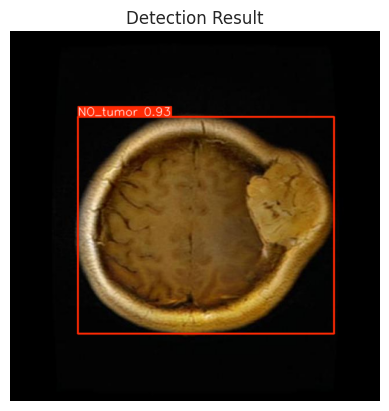

In [ ]:
from google.colab import files
import cv2, time, numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Upload image
uploaded = files.upload()
file_name = list(uploaded.keys())[0]
image = Image.open(file_name).convert('RGB')
input_image = np.array(image)

# Load model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Inference
results = model(input_image)

# Extract timing info from results[0].speed dictionary
speed = results[0].speed  # {'preprocess': 1.7, 'inference': 12.2, 'postprocess': 1.7}

pre_time = speed.get('preprocess', 0.0)
inf_time = speed.get('inference', 0.0)
post_time = speed.get('postprocess', 0.0)
total_time = pre_time + inf_time + post_time

print(f"Pre-processing time: {pre_time:.2f} ms")
print(f"Inference time: {inf_time:.2f} ms")
print(f"Post-processing time: {post_time:.2f} ms")
print(f"Total computational time: {total_time:.2f} ms")

# Show annotated image
annotated = results[0].plot()
plt.imshow(annotated)
plt.axis('off')
plt.title("Detection Result")
plt.show()




0: 416x416 1 NO_tumor, 13.0ms
Speed: 1.8ms preprocess, 13.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 meningioma, 29.3ms
Speed: 3.1ms preprocess, 29.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 NO_tumor, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 NO_tumor, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 meningioma, 10.3ms
Speed: 2.1ms preprocess, 10.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 meningioma, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 meningioma, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 meningioma, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.5ms postprocess per imag

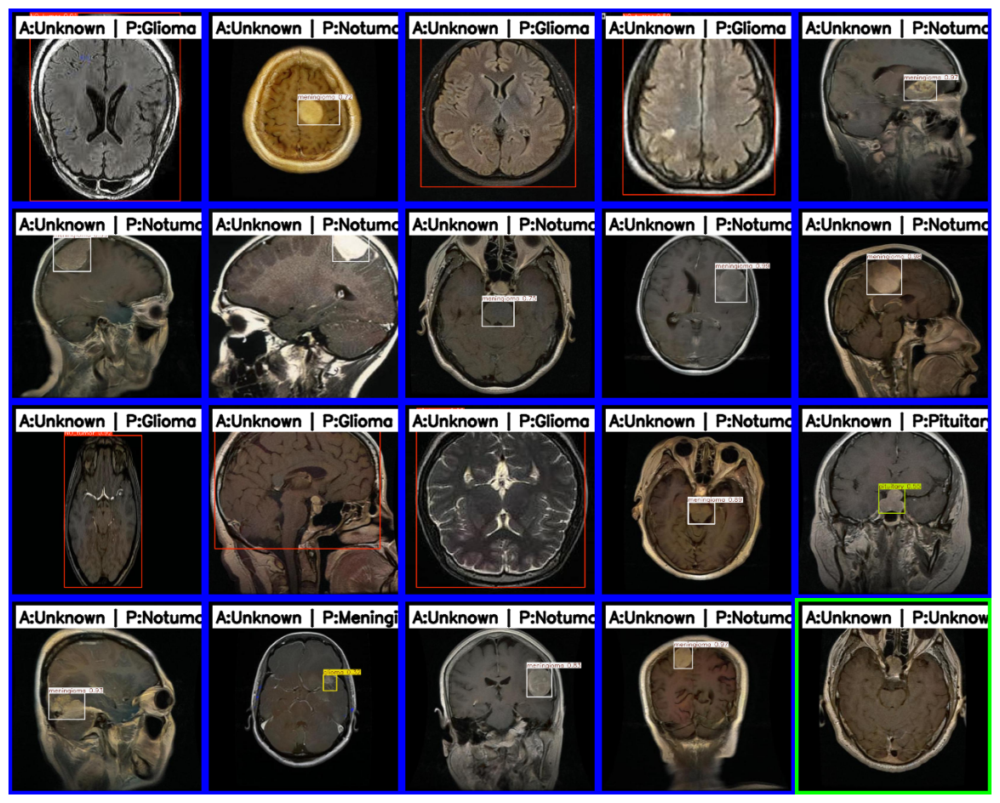


Total Correct Predictions: 1 out of 20
RMSE: 4.249
MAE: 0.950


In [ ]:
import os, random, cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from sklearn.metrics import mean_squared_error, mean_absolute_error
from ultralytics import YOLO

# Map prefix to class index
tumor_map = {'Tr-gl': 0, 'Tr-me': 1, 'Tr-no': 2, 'Tr-pi': 3}
tumor_names = ['Glioma', 'Meningioma', 'Notumor', 'Pituitary']

# Load YOLO model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Folder path and select 20 random images
folder_path = "/content/drive/MyDrive/BTL/test/images"
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
selected_files = random.sample(image_files, 20)

actual_labels = []
pred_labels = []
collage_cells = []
correct_count = 0

# Font settings
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.7
font_thickness = 2
box_thickness = 4

# White background color
background_color = (255, 255, 255)

# Predict and annotate each image
for img_name in selected_files:
    path = os.path.join(folder_path, img_name)
    image = Image.open(path).convert("RGB")
    image_np = np.array(image)

    # Predict
    result = model(image_np)[0]
    boxes = result.boxes
    pred_class_idx = int(boxes.cls[0]) if boxes.cls.numel() > 0 else -1
    pred_name = tumor_names[pred_class_idx] if pred_class_idx >= 0 else "Unknown"

    # Actual label
    prefix = img_name[:5]
    actual_idx = tumor_map.get(prefix, -1)
    actual_name = tumor_names[actual_idx] if actual_idx >= 0 else "Unknown"

    actual_labels.append(actual_idx)
    pred_labels.append(pred_class_idx)

    is_correct = actual_idx == pred_class_idx
    if is_correct:
        correct_count += 1

    # Annotate
    annotated = result.plot()

    # Resize to uniform size
    annotated = cv2.resize(annotated, (256, 256))

    # Draw annotation box color: green for correct, red for wrong
    border_color = (0, 255, 0) if is_correct else (0, 0, 255)

    # Create label text
    label_text = f"A:{actual_name} | P:{pred_name}"
    text_size = cv2.getTextSize(label_text, font, font_scale, font_thickness)[0]

    # Draw white rectangle for text bg
    cv2.rectangle(annotated, (5, 5), (5 + text_size[0] + 10, 35), (255, 255, 255), -1)

    # Draw label text (bold black)
    cv2.putText(annotated, label_text, (10, 28), font, font_scale, (0, 0, 0), font_thickness, cv2.LINE_AA)

    # Add colored border around image
    annotated = cv2.copyMakeBorder(annotated, 5, 5, 5, 5, cv2.BORDER_CONSTANT, value=border_color)

    # Convert to PIL
    collage_cells.append(Image.fromarray(annotated))

# Collage config (5x4)
collage_width = 5
collage_height = 4
cell_width, cell_height = collage_cells[0].size
collage_image = Image.new('RGB', (cell_width * collage_width, cell_height * collage_height), background_color)

# Paste all images into collage
for i, img in enumerate(collage_cells):
    x = (i % collage_width) * cell_width
    y = (i // collage_width) * cell_height
    collage_image.paste(img, (x, y))

# Show collage
plt.figure(figsize=(15, 12))
plt.imshow(collage_image)
plt.axis('off')
#plt.title("5x4 Collage with Actual | Predicted Annotations", fontsize=18, fontweight='bold')
plt.show()

# Metrics
y1 = 20
y2 = correct_count
rmse = np.sqrt((y1 - y2)**2 / y1)
mae = (y1 - y2) / y1

print(f"\nTotal Correct Predictions: {y2} out of {y1}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")



0: 320x320 1 Glioma, 21.1ms
Speed: 1.6ms preprocess, 21.1ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 Meningioma, 21.7ms
Speed: 1.8ms preprocess, 21.7ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 Glioma, 21.7ms
Speed: 1.8ms preprocess, 21.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 Glioma, 21.8ms
Speed: 2.3ms preprocess, 21.8ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 Pituitary, 21.4ms
Speed: 1.6ms preprocess, 21.4ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

0: 192x320 1 Notumor, 61.8ms
Speed: 1.3ms preprocess, 61.8ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)

0: 320x320 1 Pituitary, 76.6ms
Speed: 3.5ms preprocess, 76.6ms inference, 3.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 Meningioma, 27.9ms
Speed: 1.7ms preprocess, 27.9ms inference, 2.0ms postprocess per image at 

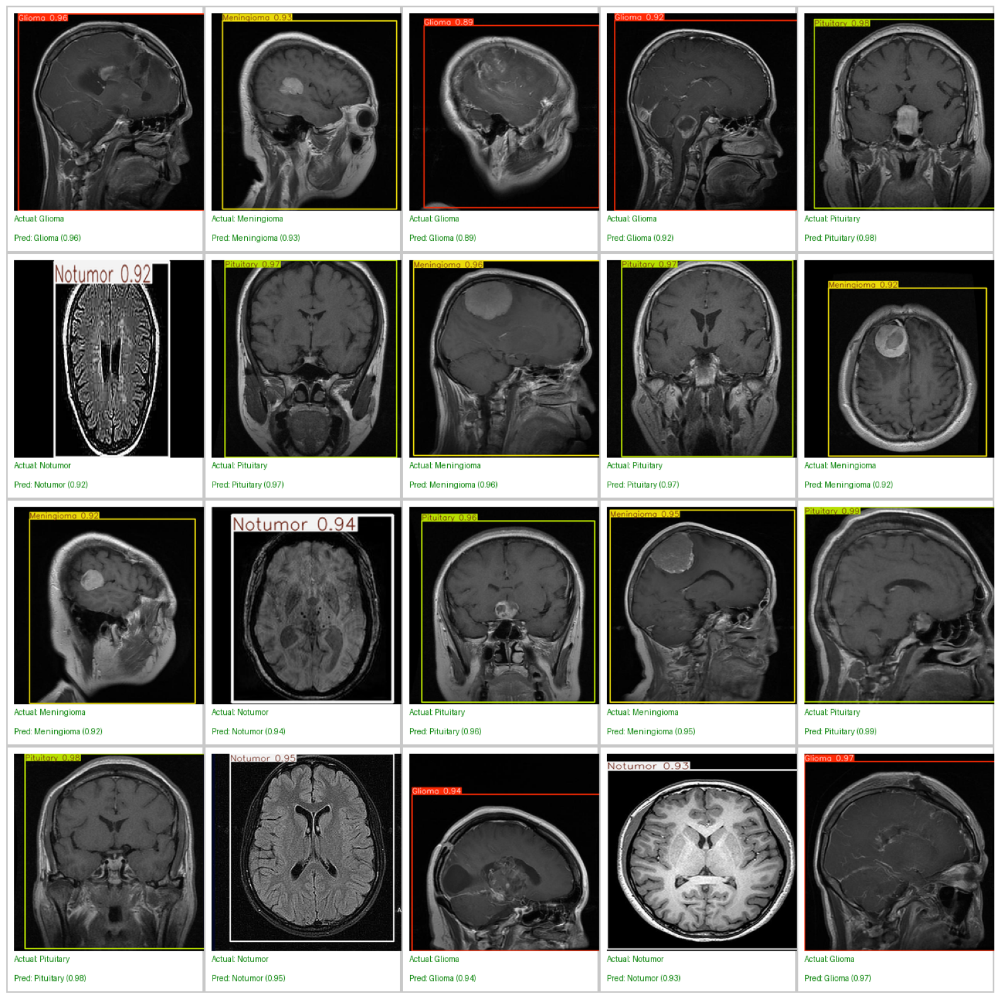


📊 Prediction Metrics:
✅ Total Images: 20
✅ Correct Predictions: 20
✅ Accuracy: 100.00%
✅ RMSE: 0.000
✅ MAE: 0.000
Total prediction time across 20 images: 1.20 seconds
Overall cell execution time (including collage generation): 10.54 seconds


In [ ]:
import os
import random
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from sklearn.metrics import mean_squared_error, mean_absolute_error
from ultralytics import YOLO
import time

# Define thresholds
confidence_threshold = 0.5  # Confidence threshold
iou_threshold = 0.3        # IoU threshold

# Start timing for inference (prediction visualization)
start_interference_vis = time.time()

# Map prefix to class index
tumor_map = {'Tr-gl': 0, 'Tr-me': 1, 'Tr-no': 2, 'Tr-pi': 3}
tumor_names = ['Glioma', 'Meningioma', 'Notumor', 'Pituitary']

# Load YOLO model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Folder path
folder_path = "/content/drive/MyDrive/BTupdate/BT600"
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
selected_files = random.sample(image_files, 20)

actual_labels = []
pred_labels = []
collage_cells = []

# Font for annotation
try:
    pil_font = ImageFont.truetype("arial.ttf", 18)  # Use Arial for clarity and readability
except:
    pil_font = ImageFont.load_default()

correct_count = 0

# Initialize inference_time before the loop
interference_time = 0.0

for img_name in selected_files:
    path = os.path.join(folder_path, img_name)
    image = Image.open(path).convert("RGB")
    image_np = np.array(image)

    # Predict with thresholds
    # Start timing for prediction on THIS image
    start_prediction = time.time()
    result = model(image_np, conf=confidence_threshold, iou=iou_threshold)[0]
    end_prediction = time.time()

    boxes = result.boxes
    pred_class_idx = int(boxes.cls[0]) if boxes.cls.numel() > 0 else -1
    pred_conf = float(boxes.conf[0]) if boxes.cls.numel() > 0 else 0.0
    pred_name = tumor_names[pred_class_idx] if pred_class_idx >= 0 else "Unknown"

    # Actual label from filename
    prefix = img_name[:5]
    actual_idx = tumor_map.get(prefix, -1)
    actual_name = tumor_names[actual_idx] if actual_idx >= 0 else "Unknown"

    actual_labels.append(actual_idx)
    pred_labels.append(pred_class_idx)

    if actual_idx == pred_class_idx:
        correct_count += 1

    # Annotate image with bounding boxes
    annotated = result.plot()  # Default plot from YOLO (red boxes)

    # Convert to PIL and resize
    annotated_pil = Image.fromarray(annotated).resize((256, 256), Image.Resampling.LANCZOS)

    # Create a new image with a white background and border
    cell_height = 320  # Increased height for text and border
    new_img = Image.new('RGB', (256, cell_height), (255, 255, 255))
    draw = ImageDraw.Draw(new_img)

    # Add a thin gray border around the image
    border_color = (200, 200, 200)
    draw.rectangle([(0, 0), (255, cell_height-1)], outline=border_color, width=2)

    # Paste the annotated image
    new_img.paste(annotated_pil, (10, 10))  # Add padding inside border

    # Draw text below image with improved styling
    text_y_offset = 270
    if actual_idx >= 0 and pred_class_idx >= 0:
        # Use green for correct predictions, red for incorrect
        text_color = (0, 128, 0) if actual_idx == pred_class_idx else (255, 0, 0)
        draw.text((10, text_y_offset), f"Actual: {actual_name}", fill=text_color, font=pil_font)
        draw.text((10, text_y_offset + 25), f"Pred: {pred_name} ({pred_conf:.2f})", fill=text_color, font=pil_font)
    else:
        draw.text((10, text_y_offset), f"Actual: {actual_name}", fill=(0, 0, 255), font=pil_font)
        draw.text((10, text_y_offset + 25), f"Pred: {pred_name} ({pred_conf:.2f})", fill=(0, 0, 255), font=pil_font)

    collage_cells.append(new_img)

    # Add the prediction time for this image to the total
    interference_time += (end_prediction - start_prediction)

# Create 5x4 collage (20 images)
collage_width = 5
collage_height = 4
cell_width, cell_height = collage_cells[0].size
collage_image = Image.new('RGB', (cell_width * collage_width, cell_height * collage_height), (255, 255, 255))

for i, img in enumerate(collage_cells):
    x = (i % collage_width) * cell_width
    y = (i // collage_width) * cell_height
    collage_image.paste(img, (x, y))

# Enhance collage display
plt.figure(figsize=(20, 16))  # Larger figure for better visibility
plt.imshow(collage_image)
plt.axis('off')
#plt.title("5x4 Collage of Brain Tumor Detection\nActual vs. Predicted Labels",
#          fontsize=20, fontweight='bold', pad=20, color='black')
plt.tight_layout()

# Save the collage with high resolution
save_dir = "/content/stroke_results3"
os.makedirs(save_dir, exist_ok=True)
collage_path = os.path.join(save_dir, "enhanced_collage.png")
collage_image.save(collage_path, dpi=(300, 300))
print(f"Collage saved to: {collage_path}")

# Show the collage
plt.show()

# Metrics Calculation
y1 = 20  # Total number of images
y2 = correct_count  # Number of correct predictions

rmse = np.sqrt((y1 - y2)**2 / y1) if y1 > 0 else 0
mae = (y1 - y2) / y1 if y1 > 0 else 0

print(f"\n📊 Prediction Metrics:")
print(f"✅ Total Images: {y1}")
print(f"✅ Correct Predictions: {y2}")
print(f"✅ Accuracy: {(y2 / y1 * 100):.2f}%")
print(f"✅ RMSE: {rmse:.3f}")
print(f"✅ MAE: {mae:.3f}")

# End timing for interference visualization (overall cell time)
end_interference_vis = time.time()
overall_cell_time = end_interference_vis - start_interference_vis

# The 'interference_time' variable now holds the sum of prediction times for each image in the loop.
print(f"Total prediction time across {y1} images: {interference_time:.2f} seconds")
print(f"Overall cell execution time (including collage generation): {overall_cell_time:.2f} seconds")


0: 416x416 1 Pituitary, 18.4ms
Speed: 1.4ms preprocess, 18.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Notumor, 18.4ms
Speed: 2.0ms preprocess, 18.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Meningioma, 18.4ms
Speed: 2.2ms preprocess, 18.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Meningioma, 18.5ms
Speed: 2.2ms preprocess, 18.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Glioma, 18.4ms
Speed: 1.9ms preprocess, 18.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Meningioma, 18.4ms
Speed: 2.5ms preprocess, 18.4ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Glioma, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 Meningioma, 18.4ms
Speed: 2.5ms preprocess, 18.4ms inference, 0.5ms postprocess per imag

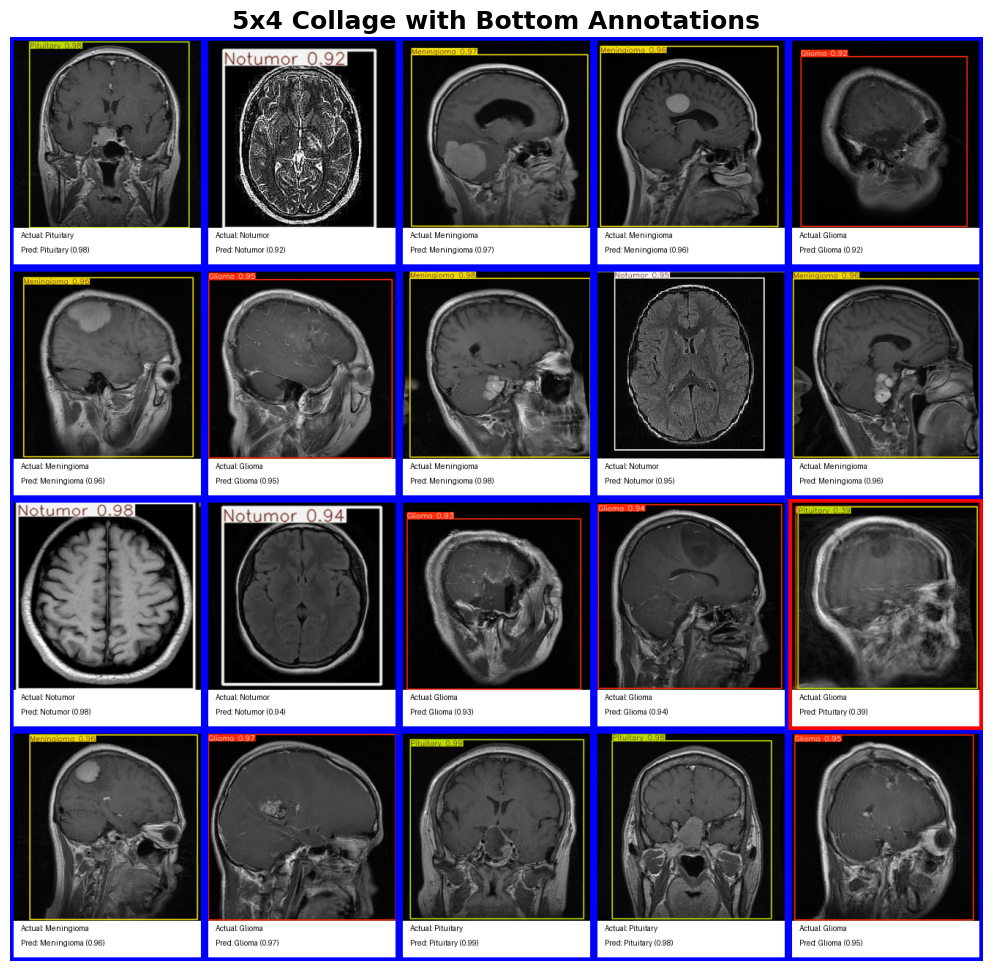


📊 Prediction Metrics:
✅ Total Images: 20
✅ Correct Predictions: 19
✅ Accuracy: 95.00%
✅ RMSE: 0.224
✅ MAE: 0.050
⏱️ Total Prediction Time for 20 Images: 1.03 seconds
⏱️ Average Time per Image: 0.052 seconds


In [ ]:
#Main
import os
import random
import time
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from sklearn.metrics import mean_squared_error, mean_absolute_error
from ultralytics import YOLO

# Class mapping
tumor_map = {'Tr-gl': 0, 'Tr-me': 1, 'Tr-no': 2, 'Tr-pi': 3}
tumor_names = ['Glioma', 'Meningioma', 'Notumor', 'Pituitary']

# Load model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Image list
folder_path = "/content/drive/MyDrive/BTupdate/BT600"
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
selected_files = random.sample(image_files, 20)

actual_labels = []
pred_labels = []
collage_cells = []
correct_count = 0

# Start timing total prediction
start_time = time.time()

for img_name in selected_files:
    path = os.path.join(folder_path, img_name)
    image = Image.open(path).convert("RGB")
    image_np = np.array(image)

    # Start timing prediction for this image
    pred_start = time.time()
    result = model(image_np)[0]
    pred_end = time.time()

    boxes = result.boxes
    pred_idx = int(boxes.cls[0]) if boxes.cls.numel() > 0 else -1
    pred_name = tumor_names[pred_idx] if pred_idx >= 0 else "Unknown"
    pred_score = float(boxes.conf[0]) if boxes.conf.numel() > 0 else 0.0

    prefix = img_name[:5]
    actual_idx = tumor_map.get(prefix, -1)
    actual_name = tumor_names[actual_idx] if actual_idx >= 0 else "Unknown"

    actual_labels.append(actual_idx)
    pred_labels.append(pred_idx)

    is_correct = actual_idx == pred_idx
    if is_correct:
        correct_count += 1

    # Annotate
    annotated = result.plot()
    annotated = cv2.resize(annotated, (256, 256))

    annotated_pil = Image.fromarray(annotated)

    # Create new image with bottom space for text
    new_img = Image.new('RGB', (256, 306), (255, 255, 255))
    new_img.paste(annotated_pil, (0, 0))

    try:
        font = ImageFont.truetype("arial.ttf", 16)
    except:
        font = ImageFont.load_default()

    draw = ImageDraw.Draw(new_img)
    draw.text((10, 260), f"Actual: {actual_name}", fill=(0, 0, 0), font=font)
    draw.text((10, 280), f"Pred: {pred_name} ({pred_score:.2f})", fill=(0, 0, 0), font=font)

    # Add border: Blue if correct, Red if wrong
    border_color = (0, 0, 255) if is_correct else (255, 0, 0)
    bordered_img = Image.new('RGB', (266, 316), border_color)
    bordered_img.paste(new_img, (5, 5))

    collage_cells.append(bordered_img)

end_time = time.time()
total_time = end_time - start_time
avg_time_per_image = total_time / 20

# Create 5x4 collage
cols, rows = 5, 4
cell_w, cell_h = collage_cells[0].size
collage = Image.new('RGB', (cell_w * cols, cell_h * rows), (255, 255, 255))

for idx, cell in enumerate(collage_cells):
    x = (idx % cols) * cell_w
    y = (idx // cols) * cell_h
    collage.paste(cell, (x, y))

# Display
plt.figure(figsize=(15, 12))
plt.imshow(collage)
plt.axis('off')
plt.title("5x4 Collage with Bottom Annotations", fontsize=18, fontweight='bold')
plt.show()

# Accuracy metrics
y1 = 20
y2 = correct_count
rmse = np.sqrt((y1 - y2)**2 / y1)
mae = (y1 - y2) / y1

print(f"\n📊 Prediction Metrics:")
print(f"✅ Total Images: {y1}")
print(f"✅ Correct Predictions: {y2}")
print(f"✅ Accuracy: {(y2 / y1 * 100):.2f}%")
print(f"✅ RMSE: {rmse:.3f}")
print(f"✅ MAE: {mae:.3f}")
print(f"⏱️ Total Prediction Time for 20 Images: {total_time:.2f} seconds")
print(f"⏱️ Average Time per Image: {avg_time_per_image:.3f} seconds")


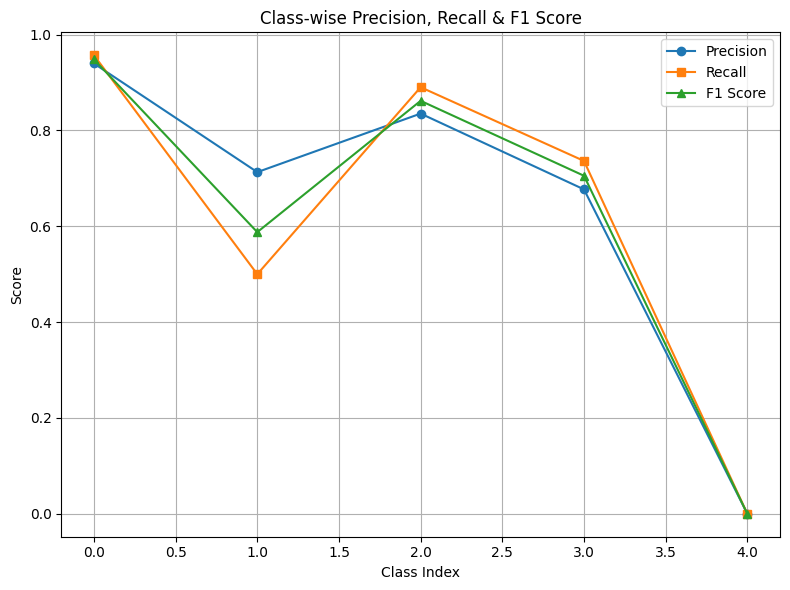

In [ ]:
#f1 score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# Set save directory
save_dir = "/content/BTresult3"
os.makedirs(save_dir, exist_ok=True)

# Load precision & recall
precision = metrics.box.p
recall = metrics.box.r

# Calculate F1 score
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)  # small epsilon to avoid zero division

# Create DataFrame
df = pd.DataFrame({
    "Class Index": list(range(len(precision))),
    "Precision": precision,
    "Recall": recall,
    "F1 Score": f1_scores
})

# Save CSV
f1_csv_path = os.path.join(save_dir, "precision_recall_f1.csv")
df.to_csv(f1_csv_path, index=False)

# Plot all 3 metrics
plt.figure(figsize=(8, 6))
plt.plot(df["Class Index"], df["Precision"], label="Precision", marker='o')
plt.plot(df["Class Index"], df["Recall"], label="Recall", marker='s')
plt.plot(df["Class Index"], df["F1 Score"], label="F1 Score", marker='^')
plt.xlabel("Class Index")
plt.ylabel("Score")
plt.title("Class-wise Precision, Recall & F1 Score")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(save_dir, "f1_plot.png"))
plt.show()


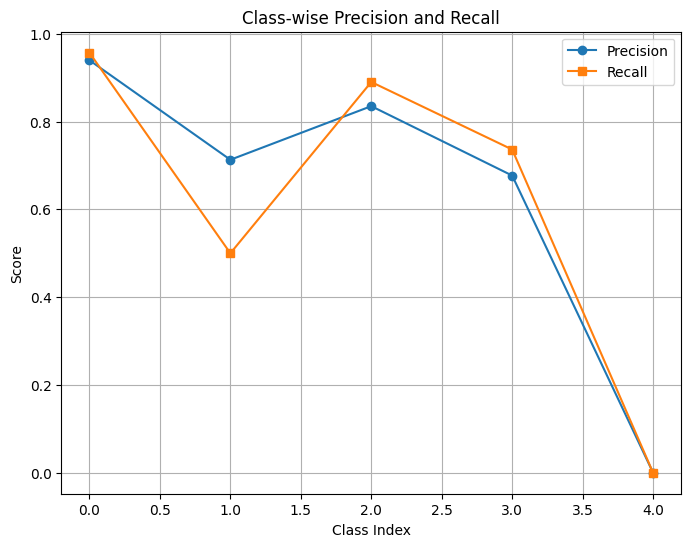

In [ ]:
# Save CSV
df = pd.DataFrame({
    "Class Index": list(range(len(precision))),
    "Precision": precision,
    "Recall": recall
})
df.to_csv(f"{save_dir}/results.csv", index=False)

# Save Accuracy Plot
plt.figure(figsize=(8,6))
plt.plot(precision, label="Precision", marker='o')
plt.plot(recall, label="Recall", marker='s')
plt.title("Class-wise Precision and Recall")
plt.xlabel("Class Index")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.savefig(f"{save_dir}/precision_recall.png")
plt.show()

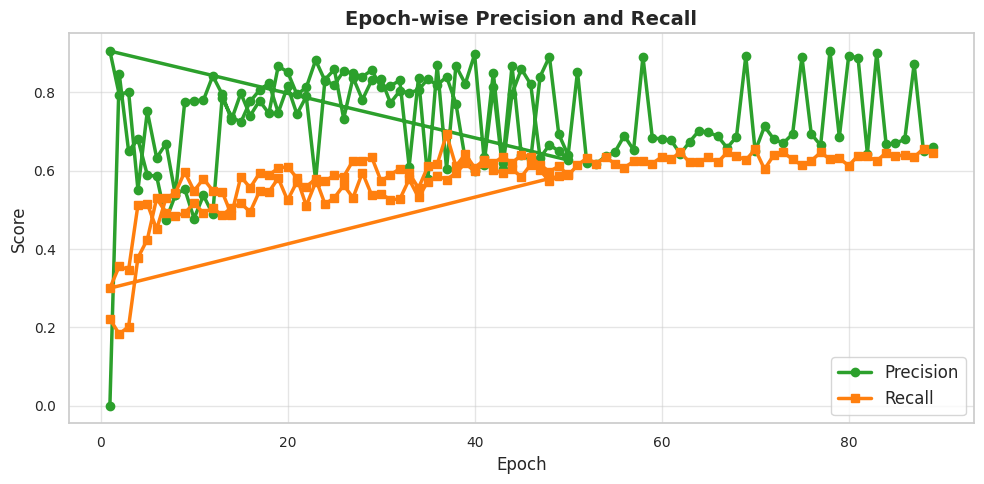

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Load CSV
df = pd.read_csv("/content/StrokeProject/exp3/results.csv")

# Extract relevant columns
epochs = df["epoch"]
precision = df["metrics/precision(B)"]
recall = df["metrics/recall(B)"]

# Save to CSV
pr_df = pd.DataFrame({
    "Epoch": epochs,
    "Precision": precision,
    "Recall": recall
})
pr_df.to_csv("/content/StrokeProject/exp3/epoch_precision_recall.csv", index=False)

# Clean Plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, precision, label="Precision", color="#2ca02c", linewidth=2.5, marker='o', markersize=6)
plt.plot(epochs, recall, label="Recall", color="#ff7f0e", linewidth=2.5, marker='s', markersize=6)

# Style
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.title("Epoch-wise Precision and Recall", fontsize=14, weight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='-', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()

# Save & Show
plt.savefig("/content/StrokeProject/exp3/epoch_precision_recall_plot.png", dpi=300)
plt.show()


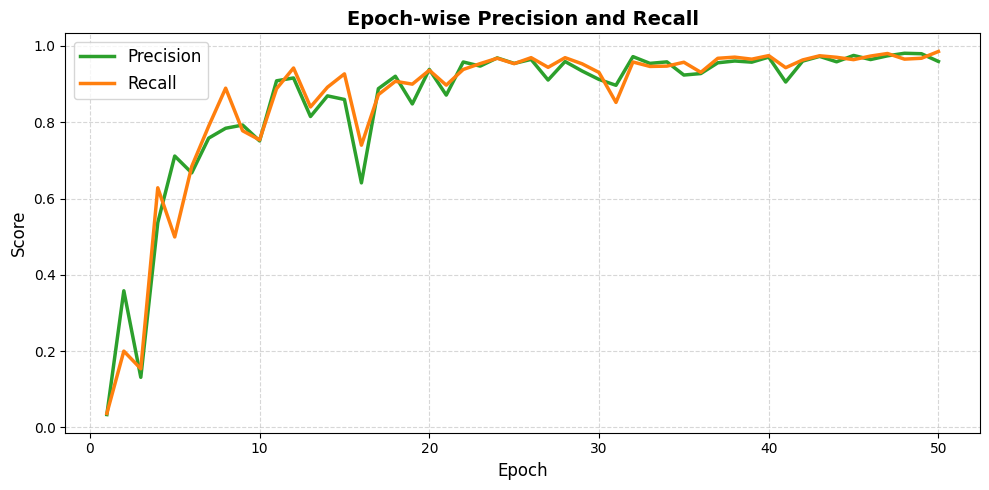

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Load CSV
df = pd.read_csv("/content/StrokeProject/exp3/results.csv")

# Extract relevant data
epochs = df["epoch"]
precision = df["metrics/precision(B)"]
recall = df["metrics/recall(B)"]

# Save precision-recall CSV
pr_df = pd.DataFrame({
    "Epoch": epochs,
    "Precision": precision,
    "Recall": recall
})
pr_df.to_csv("/content/StrokeProject/exp3/epoch_precision_recall.csv", index=False)

# Clean, smooth line plot (no dots)
plt.figure(figsize=(10, 5))
plt.plot(epochs, precision, label="Precision", color="#2ca02c", linewidth=2.5)
plt.plot(epochs, recall, label="Recall", color="#ff7f0e", linewidth=2.5)

# Styling
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.title("Epoch-wise Precision and Recall", fontsize=14, weight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()

# Save and show
plt.savefig("/content/StrokeProject/exp3/epoch_precision_recall_plot.png", dpi=300)
plt.show()


In [ ]:
import os

image_folder = '/content/drive/MyDrive/BTupdate/train/images/'
file_list = os.listdir(image_folder)

print("Total files found:", len(file_list))
print("First few files:", file_list[:10])

Total files found: 4400
First few files: ['Tr-no_0107.npy', 'Tr-no_0108.npy', 'Tr-no_0109.npy', 'Tr-no_0110.npy', 'Tr-no_0111.npy', 'Tr-no_0112.npy', 'Tr-no_0113.npy', 'Tr-no_0114.npy', 'Tr-no_0115.npy', 'Tr-no_0116.npy']


In [ ]:
import os

# Paths
label_folder = '/content/drive/MyDrive/BTupdate/valid/labels/'
num_classes =2  # adjust as needed
label_counts = [0] * num_classes
invalid_labels = {}

# Count labels
for file_name in os.listdir(label_folder):
    if file_name.endswith('.txt'):
        with open(os.path.join(label_folder, file_name), 'r') as f:
            for line_num, line in enumerate(f.readlines(), 1):
                parts = line.strip().split()
                if len(parts) == 0:
                    continue  # skip blank line
                try:
                    cls = int(parts[0])
                    if 0 <= cls < num_classes:
                        label_counts[cls] += 1
                    else:
                        invalid_labels.setdefault(cls, []).append(file_name)
                except ValueError:
                    print(f"⚠️ Warning: Non-integer label at {file_name}, line {line_num}")

# Display results
print("✅ Label Counts Per Class:")
for i, count in enumerate(label_counts):
    print(f"Class {i}: {count} boxes")

if invalid_labels:
    print("\n❌ Invalid label classes found:")


✅ Label Counts Per Class:
Class 0: 123 boxes
Class 1: 129 boxes

❌ Invalid label classes found:


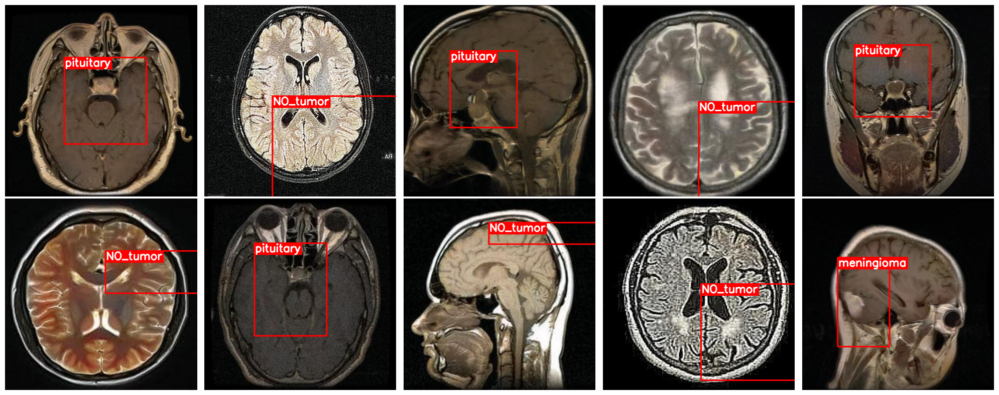

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import random

# Class names
class_names = ['NO_tumor', 'glioma', 'meningioma', 'pituitary', 'space-occupying lesion-']

# Paths
val_img_dir = '/content/drive/MyDrive/BTL/valid/images/'
val_label_dir = '/content/drive/MyDrive/BTL/valid/labels/'

# Collect image paths
val_image_paths = glob.glob(val_img_dir + '*.jpg')
random.shuffle(val_image_paths)
val_image_paths = val_image_paths[:10]

# Plotting
plt.figure(figsize=(20, 8))

for idx, img_path in enumerate(val_image_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    label_path = val_label_dir + os.path.basename(img_path).replace('.jpg', '.txt')

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = map(float, parts[:5])
                    cls = int(cls)

                    # Make box slightly smaller: apply 10% shrink
                    shrink_factor = 0.9
                    bw *= shrink_factor
                    bh *= shrink_factor

                    x1 = int((cx - bw / 2) * w)
                    y1 = int((cy - bh / 2) * h)
                    x2 = int((cx + bw / 2) * w)
                    y2 = int((cy + bh / 2) * h)

                    # Draw a slightly thicker box (3)
                    cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)

                    # Draw label
                    label = class_names[cls]
                    font_scale = 1.2
                    thickness = 3
                    font = cv2.FONT_HERSHEY_SIMPLEX
                    (text_w, text_h), baseline = cv2.getTextSize(label, font, font_scale, thickness)

                    text_x = x1 + 2
                    text_y = y1 + text_h + 2

                    cv2.rectangle(img, (text_x - 2, text_y - text_h - 4),
                                       (text_x + text_w + 2, text_y + baseline - 2),
                                       (255, 0, 0), -1)
                    cv2.putText(img, label, (text_x, text_y), font, font_scale, (255, 255, 255), thickness)

    # Subplot display
    plt.subplot(2, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()



image 1/1 /content/drive/MyDrive/BTL/valid/images/pituitary_917_jpg.rf.592ab4188f0cec2e64fc2e75213cef11.jpg: 416x416 2 pituitarys, 22.1ms
Speed: 2.2ms preprocess, 22.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/no_tumor_546_jpg.rf.cd7b37e7b4749b28f6d52c8ad6889292.jpg: 416x416 1 NO_tumor, 18.5ms
Speed: 2.2ms preprocess, 18.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/no_tumor_1449_jpg.rf.23f0a67b927372d9d62fa82ae384d29d.jpg: 416x416 1 NO_tumor, 27.0ms
Speed: 2.1ms preprocess, 27.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/meningioma_327_jpg.rf.ae5ab1c26ed22d282ec65d161fcd34ba.jpg: 416x416 1 meningioma, 21.4ms
Speed: 2.8ms preprocess, 21.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/meningiom

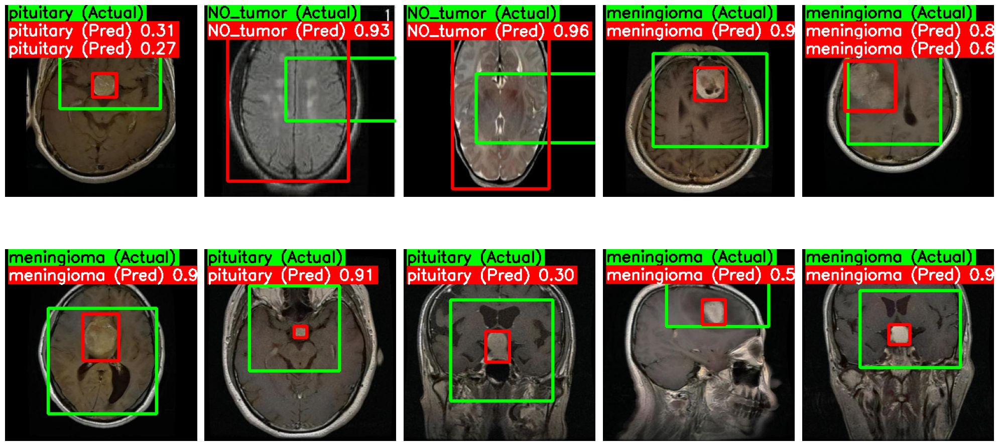

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import random
from ultralytics import YOLO

# Class names
class_names = ['NO_tumor', 'glioma', 'meningioma', 'pituitary', 'space-occupying lesion-']

# Paths
val_img_dir = '/content/drive/MyDrive/BTL/valid/images/'
val_label_dir = '/content/drive/MyDrive/BTL/valid/labels/'

# Load the best trained model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Collect image paths and select a random sample
val_image_paths = glob.glob(val_img_dir + '*.jpg')
random.shuffle(val_image_paths)
selected_image_paths = val_image_paths[:10]

# Fixed size for all images
fixed_size = (300, 300)  # Uniform size for all images

# Plotting
plt.figure(figsize=(20, 12))  # Adjusted for better spacing
#plt.suptitle("Brain Tumor Detection Results", fontsize=16, y=0.98)  # Add a main title

for idx, img_path in enumerate(selected_image_paths):
    # Load and resize image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb = cv2.resize(img_rgb, fixed_size)  # Resize to fixed dimensions
    h, w, _ = img_rgb.shape

    # --- Draw Actual (Ground Truth) Bounding Boxes and Labels ---
    label_path = val_label_dir + os.path.basename(img_path).replace('.jpg', '.txt')
    actual_labels = []
    predicted_labels = []

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = map(float, parts[:5])
                    cls = int(cls)

                    # Convert YOLO format to pixel coordinates
                    x1 = int((cx - bw / 2) * w)
                    y1 = int((cy - bh / 2) * h)
                    x2 = int((cx + bw / 2) * w)
                    y2 = int((cy + bh / 2) * h)

                    # Draw bounding box (Green for Actual)
                    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 3)  # Consistent thickness

                    # Store actual label
                    actual_labels.append(f"{class_names[cls]} (Actual)")

    # --- Draw Predicted Bounding Boxes and Labels ---
    results = model(img_path)  # Predict on the image
    for r in results:
        boxes = r.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())

            # Adjust coordinates for resized image
            x1 = int(x1 * w / img.shape[1])
            y1 = int(y1 * h / img.shape[0])
            x2 = int(x2 * w / img.shape[1])
            y2 = int(y2 * h / img.shape[0])

            # Draw bounding box (Red for Predicted)
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Consistent thickness

            # Store predicted label
            predicted_labels.append(f"{class_names[cls]} (Pred) {conf:.2f}")

    # --- Draw Labels in a Fixed Position ---
    font_scale = 0.8  # Larger font for better visibility
    thickness = 2
    font = cv2.FONT_HERSHEY_SIMPLEX
    y_offset = 20  # Starting y position for labels

    # Draw Actual Labels
    for label in actual_labels:
        (text_w, text_h), baseline = cv2.getTextSize(label, font, font_scale, thickness)
        cv2.rectangle(img_rgb, (5, y_offset - text_h - 4), (5 + text_w + 2, y_offset + baseline - 2), (0, 255, 0), -1)  # Green background
        cv2.putText(img_rgb, label, (5, y_offset), font, font_scale, (0, 0, 0), thickness)  # Black text
        y_offset += text_h + 10

    # Draw Predicted Labels
    for label in predicted_labels:
        (text_w, text_h), baseline = cv2.getTextSize(label, font, font_scale, thickness)
        cv2.rectangle(img_rgb, (5, y_offset - text_h - 4), (5 + text_w + 2, y_offset + baseline - 2), (255, 0, 0), -1)  # Red background
        cv2.putText(img_rgb, label, (5, y_offset), font, font_scale, (255, 255, 255), thickness)  # White text
        y_offset += text_h + 10

    # Subplot display
    plt.subplot(2, 5, idx + 1)
    plt.imshow(img_rgb)
    plt.axis('off')
    #plt.title(f"Image {idx+1}", fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to accommodate main title
plt.show()


image 1/1 /content/drive/MyDrive/BTL/valid/images/no_tumor_855_jpg.rf.a52d1a3997edfe6d0d665a98b8a88694.jpg: 416x416 1 NO_tumor, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/meningioma_565_jpg.rf.436f153ae0c432014185002101529a09.jpg: 416x416 1 meningioma, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/pituitary_567_jpg.rf.bb5b6ca6391cac363f1a1a69d33c07b5.jpg: 416x416 1 pituitary, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/pituitary_263_jpg.rf.915b29f4bfea50f135f1647859387a5f.jpg: 416x416 2 pituitarys, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/drive/MyDrive/BTL/valid/images/no_tumor_1263_

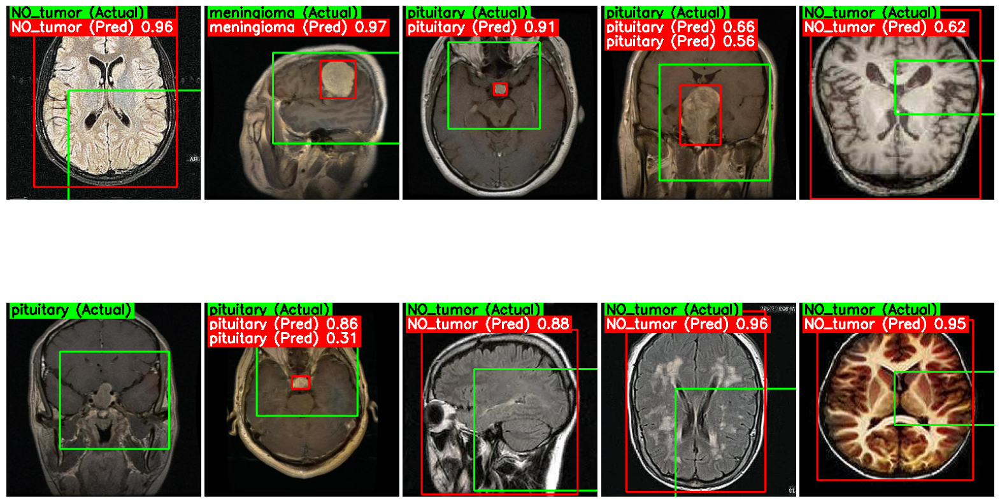

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import random
from ultralytics import YOLO

# Class names
class_names = ['NO_tumor', 'glioma', 'meningioma', 'pituitary', 'space-occupying lesion-']

# Paths
val_img_dir = '/content/drive/MyDrive/BTL/valid/images/'
val_label_dir = '/content/drive/MyDrive/BTL/valid/labels/'

# Load the best trained model
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Collect image paths and randomly select 10
val_image_paths = glob.glob(val_img_dir + '*.jpg')
random.shuffle(val_image_paths)
selected_image_paths = val_image_paths[:10]

# Resize settings
fixed_size = (300, 300)

# Plotting
fig = plt.figure(figsize=(20, 12))  # Adjust size as needed

for idx, img_path in enumerate(selected_image_paths):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb = cv2.resize(img_rgb, fixed_size)
    h, w, _ = img_rgb.shape

    label_path = val_label_dir + os.path.basename(img_path).replace('.jpg', '.txt')
    actual_labels = []
    predicted_labels = []

    # --- Draw actual boxes ---
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = map(float, parts[:5])
                    cls = int(cls)
                    x1 = int((cx - bw / 2) * w)
                    y1 = int((cy - bh / 2) * h)
                    x2 = int((cx + bw / 2) * w)
                    y2 = int((cy + bh / 2) * h)
                    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
                    actual_labels.append(f"{class_names[cls]} (Actual)")

    # --- Draw predicted boxes ---
    results = model(img_path)
    for r in results:
        boxes = r.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())
            x1 = int(x1 * w / img.shape[1])
            y1 = int(y1 * h / img.shape[0])
            x2 = int(x2 * w / img.shape[1])
            y2 = int(y2 * h / img.shape[0])
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
            predicted_labels.append(f"{class_names[cls]} (Pred) {conf:.2f}")

    # --- Draw labels neatly ---
    font_scale = 0.7
    thickness = 2  # Changed thickness to an integer
    font = cv2.FONT_HERSHEY_SIMPLEX
    y_offset = 18

    for label in actual_labels:
        (tw, th), bl = cv2.getTextSize(label, font, font_scale, thickness)
        cv2.rectangle(img_rgb, (5, y_offset - th - 3), (5 + tw + 4, y_offset + bl), (0, 255, 0), -1)
        cv2.putText(img_rgb, label, (7, y_offset), font, font_scale, (0, 0, 0), thickness)
        y_offset += th + 6

    for label in predicted_labels:
        (tw, th), bl = cv2.getTextSize(label, font, font_scale, thickness)
        cv2.rectangle(img_rgb, (5, y_offset - th - 3), (5 + tw + 4, y_offset + bl), (255, 0, 0), -1)
        cv2.putText(img_rgb, label, (7, y_offset), font, font_scale, (255, 255, 255), thickness)
        y_offset += th + 6

    # Show subplot without title
    ax = fig.add_subplot(2, 5, idx + 1)
    ax.imshow(img_rgb)
    ax.axis('off')

# Reduce vertical and horizontal space between images
plt.subplots_adjust(wspace=0.02, hspace=0.02)
plt.show()

In [ ]:
import pandas as pd
import os

# Load your result.csv file from correct path
df = pd.read_csv('StrokeProject/exp3/results.csv')

# Get the last epoch's metrics
last = df.tail(1)

# Create the metrics output string
metrics_output = "\n📊 Final Metrics at Last Epoch:\n"
metrics_output += f"✅ Precision: {last['metrics/precision(B)'].values[0]*100:.2f}%\n"
metrics_output += f"✅ Recall: {last['metrics/recall(B)'].values[0]*100:.2f}%\n"
metrics_output += f"✅ mAP@0.5: {last['metrics/mAP50(B)'].values[0]*100:.2f}%\n"
metrics_output += f"✅ mAP@0.5:0.95: {last['metrics/mAP50-95(B)'].values[0]*100:.2f}%"

# Print the metrics individually
print(metrics_output)

# Define the save directory and filename
save_dir = "/content/stroke_results3"
output_filename = "final_metrics3.txt"
output_path = os.path.join(save_dir, output_filename)

# Create the directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Save the metrics to a file
with open(output_path, "w") as f:
    f.write(metrics_output.strip())  # Use strip() to remove leading/trailing whitespace


📊 Final Metrics at Last Epoch:
✅ Precision: 66.07%
✅ Recall: 64.42%
✅ mAP@0.5: 66.22%
✅ mAP@0.5:0.95: 54.19%


In [ ]:
import pandas as pd
import os

# Load your result.csv file from correct path
df = pd.read_csv('StrokeProject/exp3/results.csv')

# Get the best epoch based on highest mAP@0.5
best = df.loc[df['metrics/mAP50(B)'].idxmax()]

# Create the metrics output string
metrics_output = "\n📊 Final Metrics at Best Epoch:\n"
metrics_output += f"🏆 Best Epoch: {int(best['epoch'])}\n"
metrics_output += f"✅ Precision: {best['metrics/precision(B)']*100:.2f}%\n"
metrics_output += f"✅ Recall: {best['metrics/recall(B)']*100:.2f}%\n"
metrics_output += f"✅ mAP@0.5: {best['metrics/mAP50(B)']*100:.2f}%\n"
metrics_output += f"✅ mAP@0.5:0.95: {best['metrics/mAP50-95(B)']*100:.2f}%"

# Print the metrics
print(metrics_output)

# Define the save directory and filename
save_dir = "/content/stroke_results3"
output_filename = "best_epoch_metrics3.txt"
output_path = os.path.join(save_dir, output_filename)

# Create the directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Save the metrics to a file
with open(output_path, "w") as f:
    f.write(metrics_output.strip())



📊 Final Metrics at Best Epoch:
🏆 Best Epoch: 69
✅ Precision: 89.23%
✅ Recall: 62.65%
✅ mAP@0.5: 66.93%
✅ mAP@0.5:0.95: 54.63%


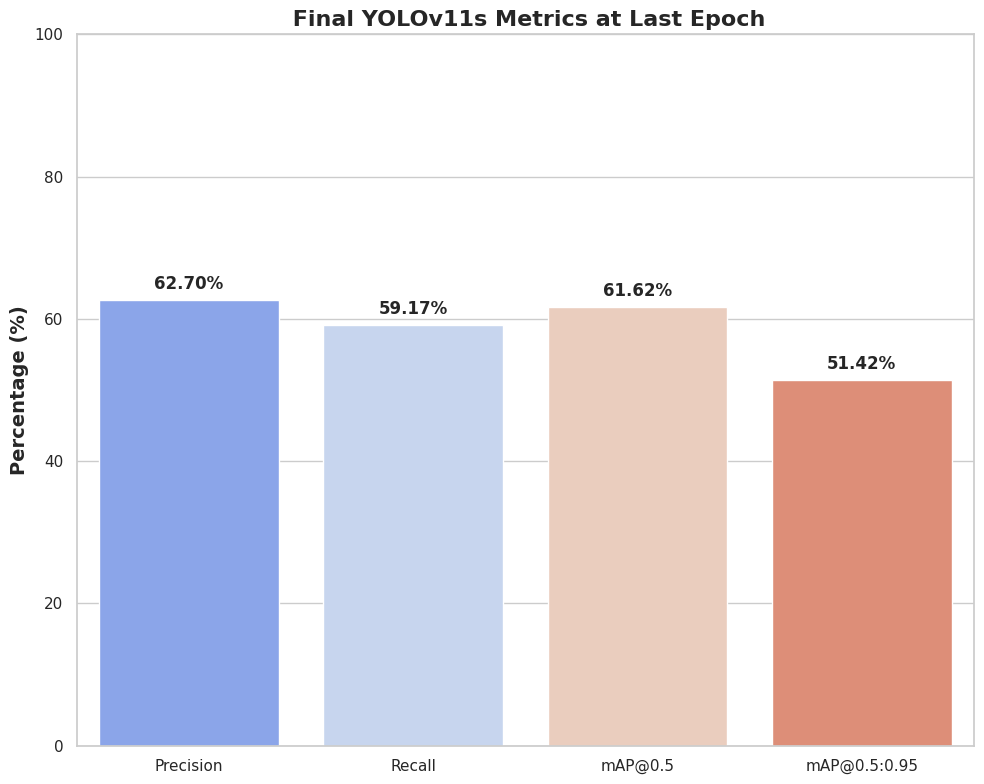

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Data
last = df.tail(1)
metrics = {
    "Precision": last['metrics/precision(B)'].values[0],
    "Recall": last['metrics/recall(B)'].values[0],
    "mAP@0.5": last['metrics/mAP50(B)'].values[0],
    "mAP@0.5:0.95": last['metrics/mAP50-95(B)'].values[0]
}

# Convert to percentage
metrics_percent = {k: round(v*100, 2) for k, v in metrics.items()}

# Plot
plt.figure(figsize=(10, 8))
bars = sns.barplot(x=list(metrics_percent.keys()), y=list(metrics_percent.values()), palette="coolwarm")

# Annotate values on top of bars
for i, value in enumerate(metrics_percent.values()):
    bars.text(i, value + 1, f"{value:.2f}%", ha='center', va='bottom', fontsize=12, fontweight='bold')

# Final touches
plt.title(" Final YOLOv11s Metrics at Last Epoch", fontsize=16, fontweight='bold')
plt.ylabel("Percentage (%)", fontsize=14,fontweight='bold')
plt.ylim(0, 100)
plt.xlabel("")  # remove x-label
plt.tight_layout()
plt.show()


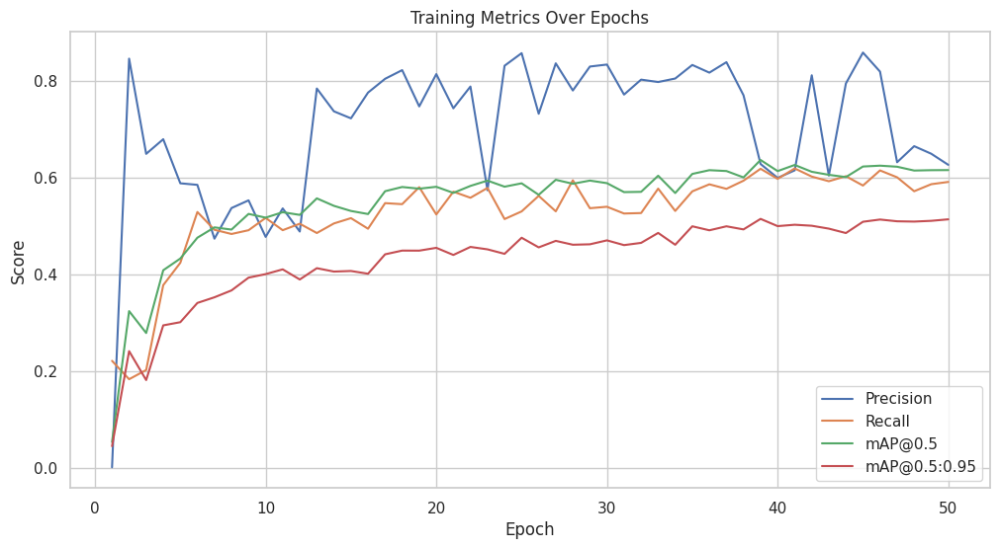

In [ ]:
# Plot training metrics over epochs
plt.figure(figsize=(12,6))
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')

plt.xlabel('Epoch')
plt.ylabel('Score')
plt.title('Training Metrics Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


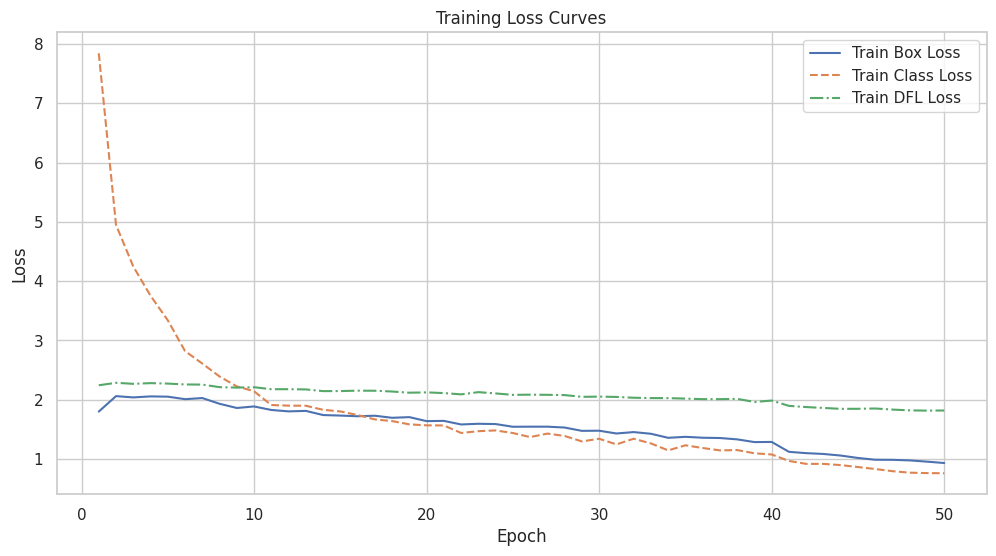

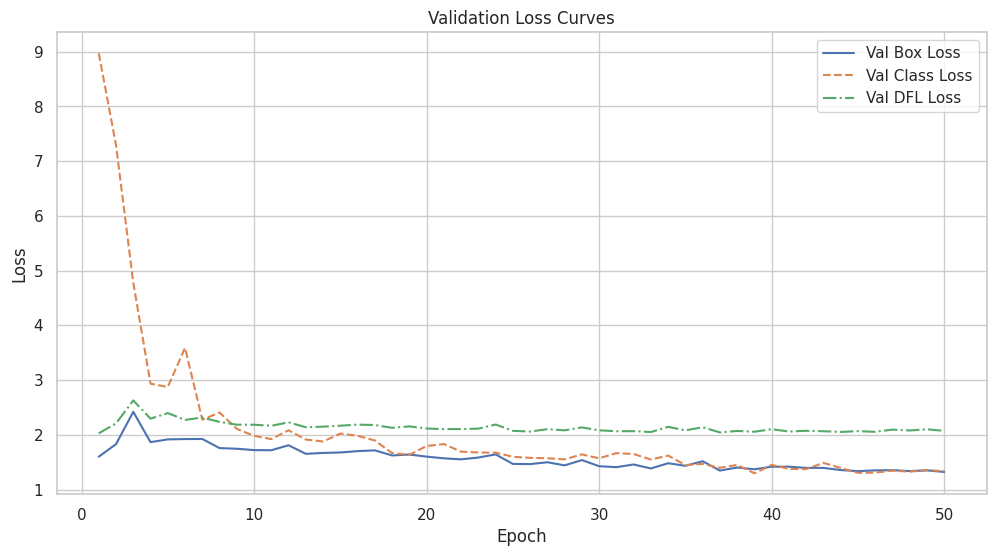

In [ ]:
import matplotlib.pyplot as plt

# Plot training losses
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss', linestyle='-')
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss', linestyle='--')
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss', linestyle='-.')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Curves')
plt.legend()
plt.grid(True)
plt.show()

# Plot validation losses
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss', linestyle='-')
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Class Loss', linestyle='--')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss', linestyle='-.')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss Curves')
plt.legend()
plt.grid(True)
plt.show()



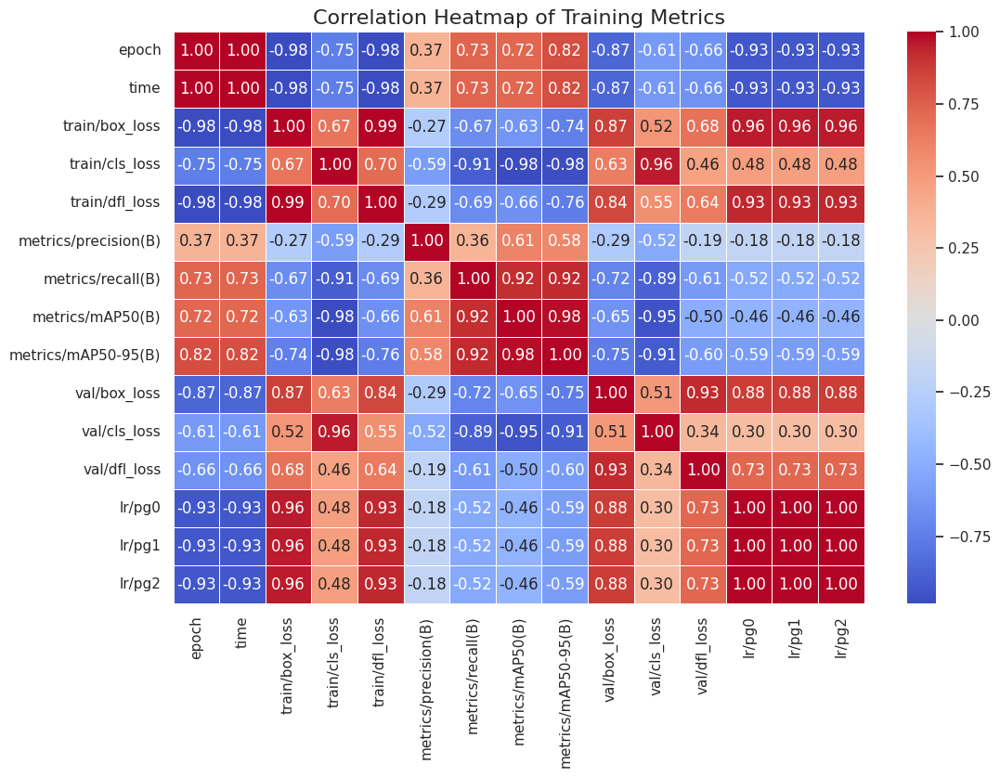

In [ ]:
# Only use numeric columns
numeric_df = df.select_dtypes(include='number')

# Correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Training Metrics", fontsize=16)
plt.show()


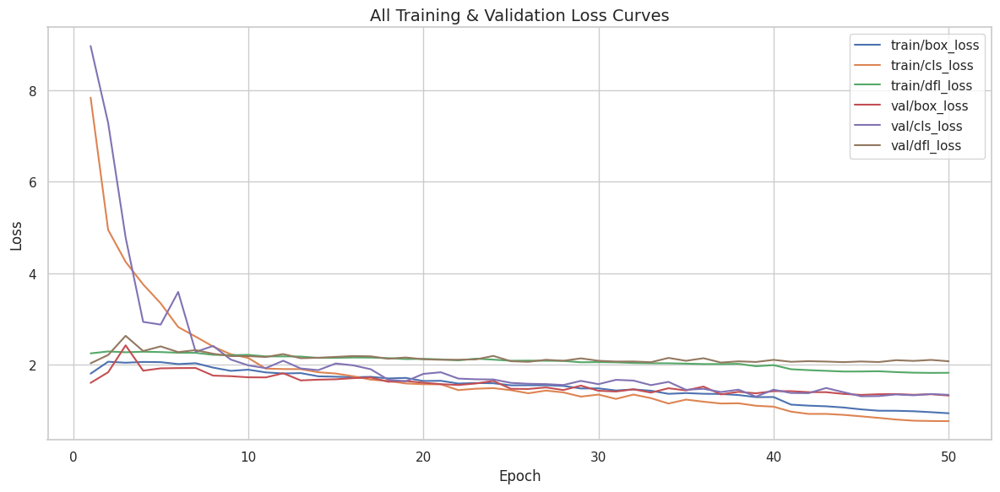

In [ ]:
plt.figure(figsize=(12, 6))
loss_columns = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss']

for col in loss_columns:
    plt.plot(df['epoch'], df[col], label=col)

plt.title("All Training & Validation Loss Curves", fontsize=14)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


📄 Epoch-wise Precision and Recall Table:


,Epoch,Precision,Recall
0,1,0.00085,0.22125
1,2,0.84687,0.18316
2,3,0.64978,0.20226
3,4,0.68008,0.37795
4,5,0.58885,0.42420
5,6,0.58561,0.52940
6,7,0.47417,0.49260
7,8,0.53756,0.48390
8,9,0.55352,0.49169
9,10,0.47786,0.51716


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


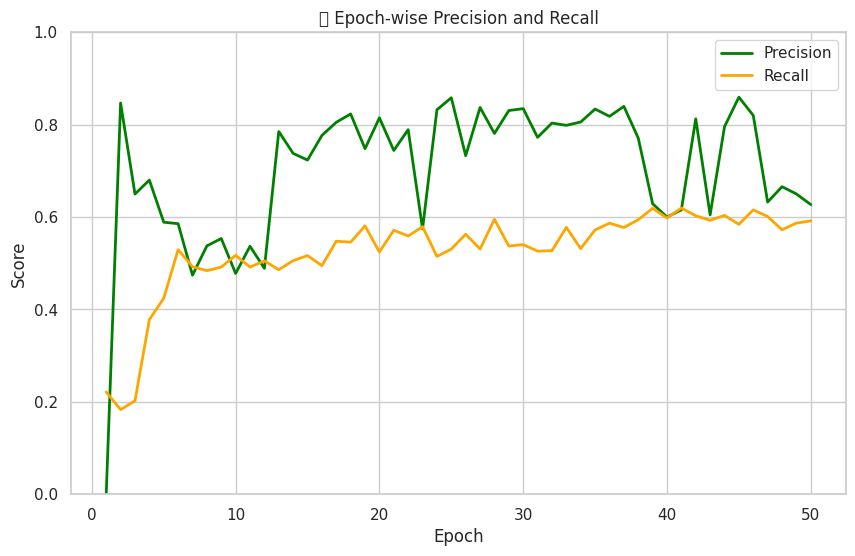

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Define the save directory and file path for the epoch-wise metrics
save_dir = "/content/BTresult3"
os.makedirs(save_dir, exist_ok=True)
# The CSV file containing epoch-wise metrics is located here
epoch_metrics_file_path = "/content/StrokeProject/exp3/epoch_precision_recall.csv"


# Read the CSV file containing epoch-wise precision and recall
if os.path.exists(epoch_metrics_file_path):
    df_epoch = pd.read_csv(epoch_metrics_file_path)
    print("📄 Epoch-wise Precision and Recall Table:")
    # Display the epoch-wise dataframe
    display(df_epoch)

    # Plot epoch-wise Precision and Recall using the correct DataFrame
    plt.figure(figsize=(10, 6))
    # Use df_epoch and specify the correct column names
    sns.lineplot(data=df_epoch, x='Epoch', y='Precision', label='Precision', color='green', linewidth=2)
    sns.lineplot(data=df_epoch, x='Epoch', y='Recall', label='Recall', color='orange', linewidth=2)
    plt.title("📈 Epoch-wise Precision and Recall")
    plt.xlabel("Epoch")
    plt.ylabel("Score")
    plt.ylim(0, 1)
    plt.grid(True)
    plt.legend()
    plt.show()
else:
    print("❌ Epoch-wise CSV file not found at:", epoch_metrics_file_path)

In [ ]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=df_epoch)

https://docs.google.com/spreadsheets/d/1v5VXBab95qqryMEHTuORF00CUPXrRkGec2zdid0Zfr4/edit#gid=0


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128376 (\N{SPIDER WEB}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


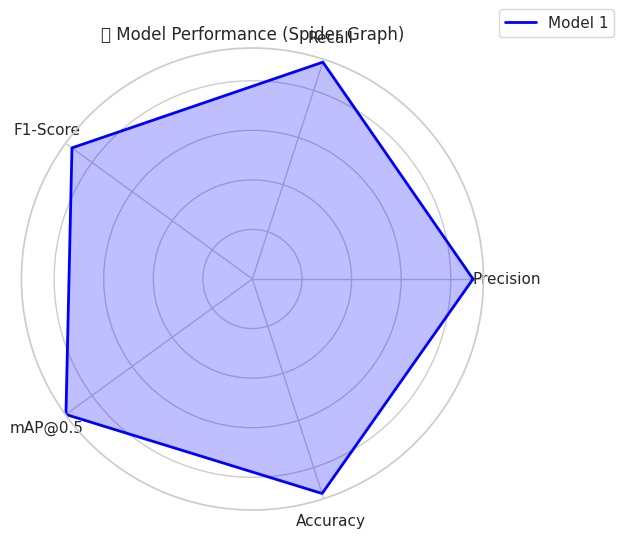

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
labels = ['Precision', 'Recall', 'F1-Score', 'mAP@0.5', 'Accuracy']
values = [0.89, 0.92, 0.90, 0.93, 0.91]

# Prepare data
num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
values += values[:1]  # repeat first value to close the circle
angles += angles[:1]

# Plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.plot(angles, values, color='blue', linewidth=2, label='Model 1')
ax.fill(angles, values, color='blue', alpha=0.25)

# Labels
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Title and legend
plt.title('🕸️ Model Performance (Spider Graph)')
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()


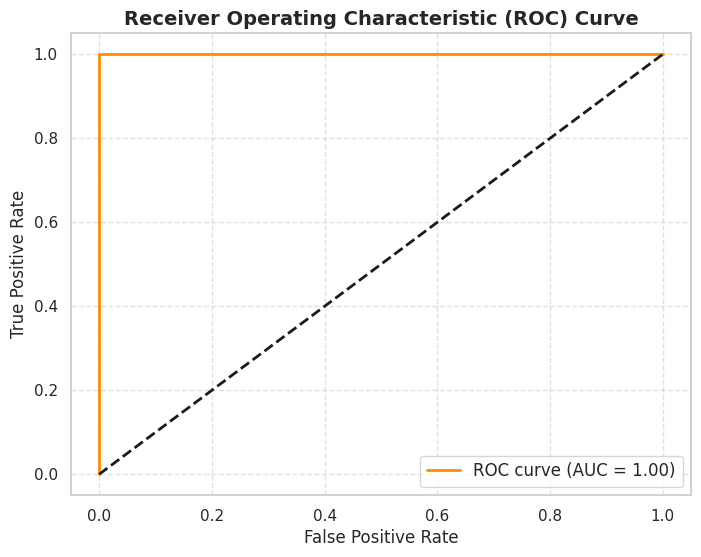

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np # Import numpy

# --- Start of suggested changes ---
# Replace these with actual y_true and y_scores from your model predictions and ground truth
# y_true should be a list or array of true binary labels (e.g., 0 or 1)
# y_scores should be a list or array of the corresponding confidence scores (e.g., from model output)

# Placeholder data (replace this with your actual data)
# Example: Suppose you have 10 instances, 5 positive (tumor) and 5 negative (no tumor or different class)
# and your model produced these confidence scores for the "positive" class
y_true = [0, 0, 1, 1, 0, 1, 0, 1, 0, 1] # Example ground truth labels (0 or 1)
y_scores = [0.1, 0.3, 0.8, 0.9, 0.2, 0.7, 0.4, 0.95, 0.15, 0.85] # Example model confidence scores for class 1

# In a real object detection scenario, generating these correctly requires:
# 1. Running model prediction on test set.
# 2. Iterating through ground truth boxes and predicted boxes.
# 3. Matching predictions to ground truths (e.g., using IoU).
# 4. Based on matches and IoU thresholds, determining true positives, false positives, true negatives, false negatives.
# 5. Extracting confidence scores for these cases to build the y_scores list, and corresponding true labels (0 or 1) for y_true.
# This is non-trivial and often requires custom code to process detection results.
# --- End of suggested changes ---


# Now, roc_curve can be called as y_true and y_scores are defined
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6)) # Add figure size for better plotting
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})', color='darkorange', linewidth=2) # Added color and linewidth
plt.plot([0, 1], [0, 1], 'k--', linewidth=2) # Added linewidth for dashed line
plt.xlabel('False Positive Rate', fontsize=12) # Added fontsize
plt.ylabel('True Positive Rate', fontsize=12) # Added fontsize
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14, fontweight='bold') # More descriptive title
plt.legend(loc='lower right', fontsize=12) # Added location and fontsize for legend
plt.grid(True, linestyle='--', alpha=0.6) # Improved grid style
plt.show()

In [ ]:
from sklearn.metrics import classification_report
import numpy as np # Ensure numpy is imported if not already

# Assume y_true and y_scores are defined from the previous cell's logic
# (using placeholder data or actual model results for the test set)

# Placeholder data (replace this with your actual data if running this cell independently)
# For this example, we'll use the placeholder data from the previous cell.
# In a real scenario, you would get y_true and y_scores from your test set predictions.
y_true = [0, 0, 1, 1, 0, 1, 0, 1, 0, 1]
y_scores = [0.1, 0.3, 0.8, 0.9, 0.2, 0.7, 0.4, 0.95, 0.15, 0.85]

# Define a threshold for classification (e.g., 0.5)
threshold = 0.5

# Convert the confidence scores (y_scores) into binary predictions (y_pred)
# If score >= threshold, predict 1 (positive class), otherwise predict 0 (negative class)
y_pred = (np.array(y_scores) >= threshold).astype(int)

# Now y_true and y_pred are defined, so we can print the classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         5

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10



In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Load your trained YOLOv10m model
# Replace "/content/StrokeProject/exp3/weights/best.pt" with the actual path to your best model weights
model = YOLO("/content/StrokeProject/exp3/weights/best.pt")

# Path to an image you want to test
# Replace with the path to one of your test images, for example:
image_path = "/content/drive/MyDrive/BTupdate/test/images/Tr-gl_0000.jpg" # Example path

# Perform inference
results = model(image_path)

# Display the annotated image
annotated_image = results[0].plot()

# Convert the annotated image (numpy array) to PIL Image to display in Colab
annotated_image_pil = Image.fromarray(annotated_image)

plt.figure(figsize=(10, 10))
plt.imshow(annotated_image_pil)
plt.axis('off')
plt.title("Inference Result")
plt.show()